# Google Deep Dream
- [blog](http://googleresearch.blogspot.sg/2015/06/inceptionism-going-deeper-into-neural.html)
- [github](https://github.com/google/deepdream/blob/master/dream.ipynb)

experiemnt of the code below

In [1]:
%matplotlib inline

In [2]:
import matplotlib.pyplot as plt
import caffe
import numpy as np
import scipy.ndimage as nd

### Set up

In [3]:
model_path = "/home/dola/opt/caffe/models/bvlc_googlenet/"
netdeploy = model_path + "deploy.prototxt"
netweights = model_path + "bvlc_googlenet.caffemodel"

In [4]:
## modify the netdeploy prototxt to allow force_backward
## read by protocol buffer 
from google.protobuf import text_format
model = caffe.io.caffe_pb2.NetParameter()
text_format.Merge(open(netdeploy).read(), model)
model.force_backward = True
print str(model)[:150]
open("../data/tmp/ddream.prototxt", "w").write(str(model))

name: "GoogleNet"
input: "data"
input_dim: 10
input_dim: 3
input_dim: 224
input_dim: 224
force_backward: true
layer {
  name: "conv1/7x7_s2"
  type: "


In [5]:
net = caffe.Classifier("../data/tmp/ddream.prototxt", netweights, raw_scale = 255,
                       mean = np.array([104., 116., 122.], dtype=np.float32), 
                       channel_swap=(2, 1, 0),  )

bear images from [here](http://1.bp.blogspot.com/-EXRWGSmjZEk/UoSJb8TodPI/AAAAAAAAAXU/oK7ShlR3eFY/s1600/free-picture-animal-motherly-love-animals_248957.jpg)


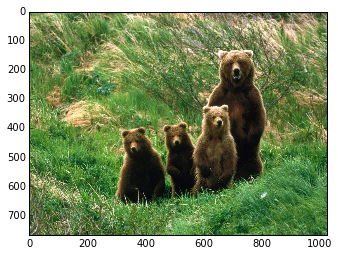

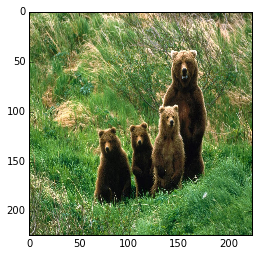

In [6]:
## verify the convertion between img and caffe input
img = caffe.io.load_image("../data/images/many-bears.jpg")
a = net.transformer.preprocess("data", img, )
plt.imshow(img)
plt.figure()
plt.imshow(net.transformer.deprocess("data", a))

### produce dreams

In [7]:
net.blobs.keys()

['data',
 'conv1/7x7_s2',
 'pool1/3x3_s2',
 'pool1/norm1',
 'conv2/3x3_reduce',
 'conv2/3x3',
 'conv2/norm2',
 'pool2/3x3_s2',
 'pool2/3x3_s2_pool2/3x3_s2_0_split_0',
 'pool2/3x3_s2_pool2/3x3_s2_0_split_1',
 'pool2/3x3_s2_pool2/3x3_s2_0_split_2',
 'pool2/3x3_s2_pool2/3x3_s2_0_split_3',
 'inception_3a/1x1',
 'inception_3a/3x3_reduce',
 'inception_3a/3x3',
 'inception_3a/5x5_reduce',
 'inception_3a/5x5',
 'inception_3a/pool',
 'inception_3a/pool_proj',
 'inception_3a/output',
 'inception_3a/output_inception_3a/output_0_split_0',
 'inception_3a/output_inception_3a/output_0_split_1',
 'inception_3a/output_inception_3a/output_0_split_2',
 'inception_3a/output_inception_3a/output_0_split_3',
 'inception_3b/1x1',
 'inception_3b/3x3_reduce',
 'inception_3b/3x3',
 'inception_3b/5x5_reduce',
 'inception_3b/5x5',
 'inception_3b/pool',
 'inception_3b/pool_proj',
 'inception_3b/output',
 'pool3/3x3_s2',
 'pool3/3x3_s2_pool3/3x3_s2_0_split_0',
 'pool3/3x3_s2_pool3/3x3_s2_0_split_1',
 'pool3/3x3_s2_p

***following codes are directly from [github](https://github.com/google/deepdream/blob/master/dream.ipynb), with some comments ***

In [64]:
def objective_L2(dst):
    dst.diff[:] = dst.data ## deep copy

def make_step(net, step_size = 1.5, end = "inception_4c/output", 
             jitter = 32, clip = True, objective = objective_L2):
    """Gradient Ascent"""
    src = net.blobs['data']
    dst = net.blobs[end]
    ## jitter is useful to generating interesting features
    ox, oy = np.random.randint(-jitter, jitter+1, 2) ## offset for x, y jitter at each step
    #print "jitter", ox, oy
    src.data[0] = np.roll(np.roll(src.data[0], ox, -1), oy, -2)
    net.forward(end = end, )
    objective(dst) ## explicitly set objective for the dst layer
    net.backward(start = end, )
    g = src.diff[0] ## gradient
    ## apply normalized ascent step to the input image to maximize
    src.data[:] += step_size/np.abs(g).mean() * g
    ## roll it back
    src.data[0] = np.roll(np.roll(src.data[0], -ox, -1), -oy, -2)
    if clip:
        bias = net.transformer.mean['data']
        src.data[:] = np.clip(src.data, -bias, 255-bias)

((768, 1024, 3), (384, 717, 3))

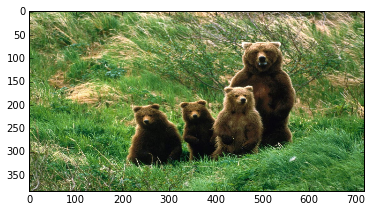

In [29]:
## how octaves work - by zooming different sizes of images
plt.imshow(nd.zoom(img, (0.5, 0.7, 1), order = 1))
img.shape, nd.zoom(img, (0.5, 0.7, 1), order=1).shape

In [59]:
def deepdream(net, base_img, iter_n=10, octave_n=4, octave_scale=1.4, reverse_octave=False,
              end='inception_4c/output', clip=True, **step_params):
    # prepare base images for all octaves
    octaves = [net.transformer.preprocess("data", base_img)]
    for i in xrange(octave_n-1):
        octaves.append(nd.zoom(octaves[-1], (1, 1.0/octave_scale,1.0/octave_scale), order=1))
    if not reverse_octave:
        octaves.append(octaves[0])
    src = net.blobs['data']
    if reverse_octave:
        detail = np.zeros_like(octaves[-1]) # allocate image for network-produced details
    else:
        detail = np.zeros_like(octaves[0])
    if reverse_octave:
        octaves = octaves[::-1]
    for octave, octave_base in enumerate(octaves):
        h, w = octave_base.shape[-2:]
        if octave > 0:
            # upscale details from the previous octave
            h1, w1 = detail.shape[-2:]
            detail = nd.zoom(detail, (1, 1.0*h/h1,1.0*w/w1), order=1)

        src.reshape(1,3,h,w) # resize the network's input image size
        ## gradually make the data more and more similiar to "dream work" 
        src.data[0] = octave_base+detail
        for i in xrange(iter_n):
            make_step(net, end=end, clip=clip, **step_params)
            
            # visualization
            vis = net.transformer.deprocess("data", src.data[0])
            if not clip: # adjust image contrast if clipping is disabled
                vis = vis*(255.0/np.percentile(vis, 99.98))
            plt.figure()
            plt.imshow(vis)
            #showarray(vis)
            print octave, i, end, vis.shape
            #clear_output(wait=True)
            
        # extract details produced on the current octave
        detail = src.data[0]-octave_base
    # returning the resulting image
    return net.transformer.deprocess("data", src.data[0])

In [53]:
## first, what the model thinks it is
from scipy import misc
classi = net.predict([img] ).argmax()
classes = np.loadtxt("/home/dola/opt/caffe/data/ilsvrc12/synset_words.txt", np.str, delimiter='\t')
classes[classi]

'n02132136 brown bear, bruin, Ursus arctos'

### it seems that the order of different octaves will generate different patterns

0 0 inception_4c/output (81, 81, 3)
0 1 inception_4c/output (81, 81, 3)
0 2 inception_4c/output (81, 81, 3)
0 3 inception_4c/output (81, 81, 3)
0 4 inception_4c/output (81, 81, 3)
0 5 inception_4c/output (81, 81, 3)
0 6 inception_4c/output (81, 81, 3)
0 7 inception_4c/output (81, 81, 3)
0 8 inception_4c/output (81, 81, 3)
0 9 inception_4c/output (81, 81, 3)
1 0 inception_4c/output (114, 114, 3)
1 1 inception_4c/output (114, 114, 3)
1 2 inception_4c/output (114, 114, 3)
1 3 inception_4c/output (114, 114, 3)
1 4 inception_4c/output (114, 114, 3)
1 5 inception_4c/output (114, 114, 3)
1 6 inception_4c/output (114, 114, 3)
1 7 inception_4c/output (114, 114, 3)
1 8 inception_4c/output (114, 114, 3)
1 9 inception_4c/output (114, 114, 3)
2 0 inception_4c/output (160, 160, 3)
2 1 inception_4c/output (160, 160, 3)
2 2 inception_4c/output (160, 160, 3)
2 3 inception_4c/output (160, 160, 3)
2 4 inception_4c/output (160, 160, 3)
2 5 inception_4c/output (160, 160, 3)
2 6 inception_4c/output (160, 16

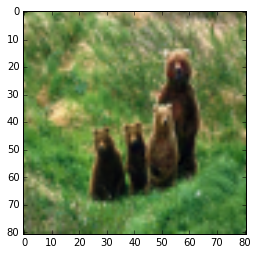

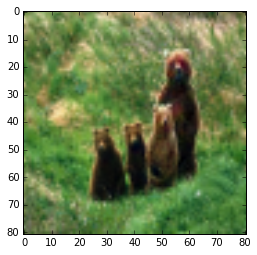

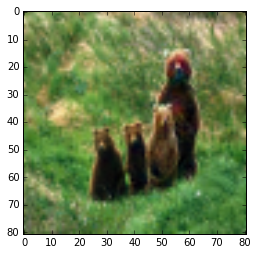

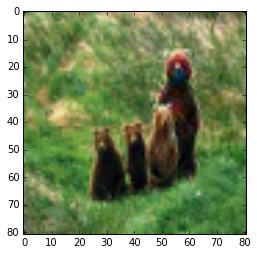

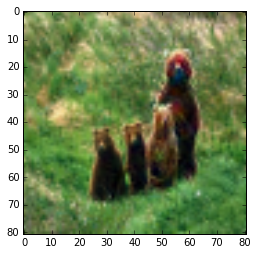

...

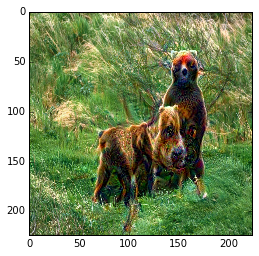

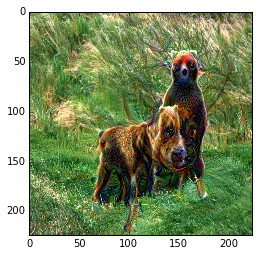

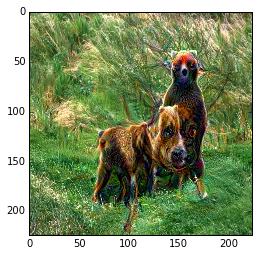

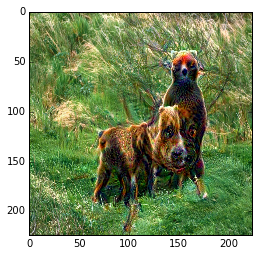

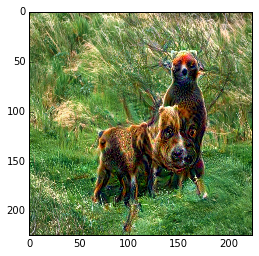

In [78]:
plt.imshow(deepdream(net, img, reverse_octave=True))

jitter 8 -20
0 0 inception_4c/output (224, 224, 3)
jitter 6 9
0 1 inception_4c/output (224, 224, 3)
jitter -31 -9
0 2 inception_4c/output (224, 224, 3)
jitter 15 24
0 3 inception_4c/output (224, 224, 3)
jitter -10 -7
0 4 inception_4c/output (224, 224, 3)
jitter 2 6
0 5 inception_4c/output (224, 224, 3)
jitter -3 19
0 6 inception_4c/output (224, 224, 3)
jitter 22 13
0 7 inception_4c/output (224, 224, 3)
jitter -31 32
0 8 inception_4c/output (224, 224, 3)
jitter -13 11
0 9 inception_4c/output (224, 224, 3)
jitter 19 -25
1 0 inception_4c/output (160, 160, 3)
jitter 3 27
1 1 inception_4c/output (160, 160, 3)
jitter -31 -6
1 2 inception_4c/output (160, 160, 3)
jitter 9 -30
1 3 inception_4c/output (160, 160, 3)
jitter 13 -19
1 4 inception_4c/output (160, 160, 3)
jitter -20 14
1 5 inception_4c/output (160, 160, 3)
jitter -26 -14
1 6 inception_4c/output (160, 160, 3)
jitter -16 -32
1 7 inception_4c/output (160, 160, 3)
jitter 5 -7
1 8 inception_4c/output (160, 160, 3)
jitter -26 16
1 9 incepti

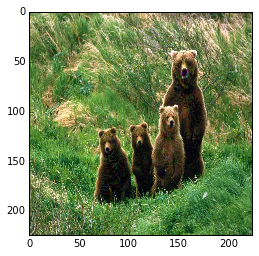

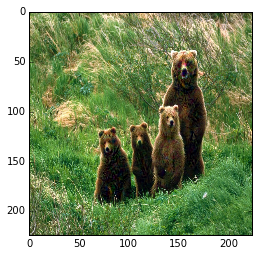

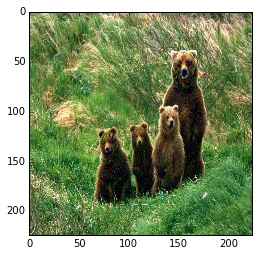

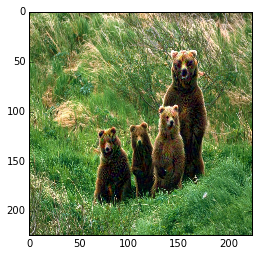

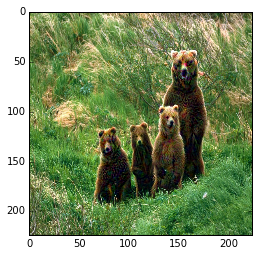

...

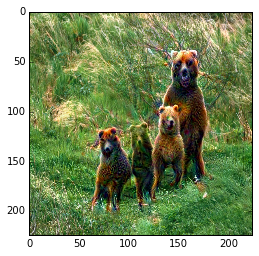

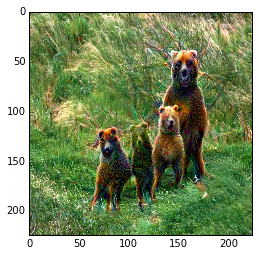

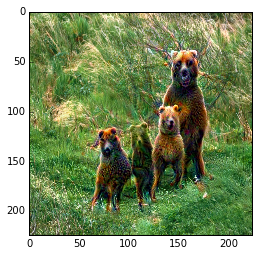

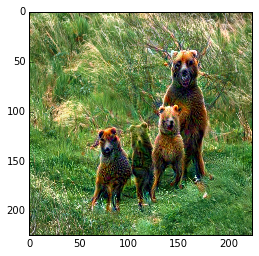

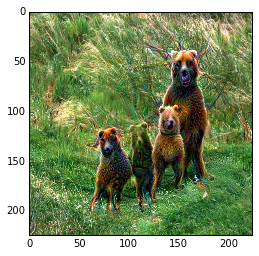

In [63]:
#plt.imshow(deepdream(net, img, end = "inception_3a/output"))
plt.imshow(deepdream(net, img))